# Imports

In [1]:
import numpy as np
import pandas as pd
import lightgbm as lgb
import matplotlib.pyplot as plt
import os
from pandas.plotting import scatter_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, cohen_kappa_score, accuracy_score, ConfusionMatrixDisplay
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, LabelEncoder

#### Path management

In [2]:
base: str
if os.getcwd() == "/kaggle/working":
    base = "/kaggle"
else:
    base = os.getcwd()

def get_full_dir(sub_dir: str) -> str:
    return os.path.join(base, sub_dir)

# Loads data

In [3]:
train_path = get_full_dir("input/playground-series-s3e5/train.csv")
test_path = get_full_dir("input/playground-series-s3e5/test.csv")

In [4]:
df_train = pd.read_csv(train_path, index_col='Id')
df_test = pd.read_csv(test_path, index_col='Id')

# Feature engineering

In [5]:
def add_columns(df):
    df['total_acid'] = df['fixed acidity'] + df['volatile acidity'] + df['citric acid']
    df['acid_density'] = df['total_acid'] * df['density']
    df['alcohol_density'] = df['alcohol'] * df['density']
    df['sulphate_density'] = df['sulphates'] * df['density']
    return df

In [6]:
df_train = add_columns(df_train)
df_test = add_columns(df_test)

# Data overview

In [7]:
df_train.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,total_acid,acid_density,alcohol_density,sulphate_density
Id,,,,,,,,,,,,,,,,
0,8.0,0.50,0.39,2.2,0.073,30.0,39.0,0.99572,3.33,0.77,12.1,6,8.89,8.851951,12.048212,0.766704
1,9.3,0.30,0.73,2.3,0.092,30.0,67.0,0.99854,3.32,0.67,12.8,6,10.33,10.314918,12.781312,0.669022
2,7.1,0.51,0.03,2.1,0.059,3.0,12.0,0.99660,3.52,0.73,11.3,7,7.64,7.614024,11.261580,0.727518
3,8.1,0.87,0.22,2.6,0.084,11.0,65.0,0.99730,3.20,0.53,9.8,5,9.19,9.165187,9.773540,0.528569
4,8.5,0.36,0.30,2.3,0.079,10.0,45.0,0.99444,3.20,1.36,9.5,6,9.16,9.109070,9.447180,1.352438


In [8]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2056 entries, 0 to 2055
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         2056 non-null   float64
 1   volatile acidity      2056 non-null   float64
 2   citric acid           2056 non-null   float64
 3   residual sugar        2056 non-null   float64
 4   chlorides             2056 non-null   float64
 5   free sulfur dioxide   2056 non-null   float64
 6   total sulfur dioxide  2056 non-null   float64
 7   density               2056 non-null   float64
 8   pH                    2056 non-null   float64
 9   sulphates             2056 non-null   float64
 10  alcohol               2056 non-null   float64
 11  quality               2056 non-null   int64  
 12  total_acid            2056 non-null   float64
 13  acid_density          2056 non-null   float64
 14  alcohol_density       2056 non-null   float64
 15  sulphate_density     

#### There are no missing vlaues in the data set

In [9]:
df_train.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,total_acid,acid_density,alcohol_density,sulphate_density
count,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000
mean,8.365175,0.527601,0.265058,2.398881,0.081856,16.955982,49.236868,0.996748,3.310569,0.641308,10.414972,5.720817,9.157834,9.130074,10.380431,0.639222
std,1.705390,0.173164,0.188267,0.858824,0.023729,10.009710,32.961141,0.001827,0.142321,0.137942,1.028825,0.853146,1.787290,1.793833,1.018378,0.137496
min,5.000000,0.180000,0.000000,1.200000,0.012000,1.000000,7.000000,0.990070,2.740000,0.390000,8.700000,3.000000,5.320000,5.279302,8.667810,0.386732
25%,7.200000,0.390000,0.090000,1.900000,0.071000,8.000000,22.000000,0.995600,3.200000,0.550000,9.500000,5.000000,7.900000,7.880650,9.482900,0.546059
50%,7.950000,0.520000,0.250000,2.200000,0.079000,16.000000,44.000000,0.996700,3.310000,0.610000,10.100000,6.000000,8.760000,8.723033,10.065660,0.609878
75%,9.200000,0.640000,0.420000,2.600000,0.090000,24.000000,65.000000,0.997800,3.390000,0.720000,11.000000,6.000000,9.980000,9.964695,11.001925,0.715532
max,15.900000,1.580000,0.760000,14.000000,0.414000,68.000000,289.000000,1.003690,3.780000,1.950000,14.000000,8.000000,16.705000,16.753277,13.962480,1.945320


In [10]:
df_train['quality'].value_counts()

5    839
6    778
7    333
4     55
8     39
3     12
Name: quality, dtype: int64

#### The data is not normalized, we might have to normalize it for some learning methods

<function matplotlib.pyplot.show(close=None, block=None)>

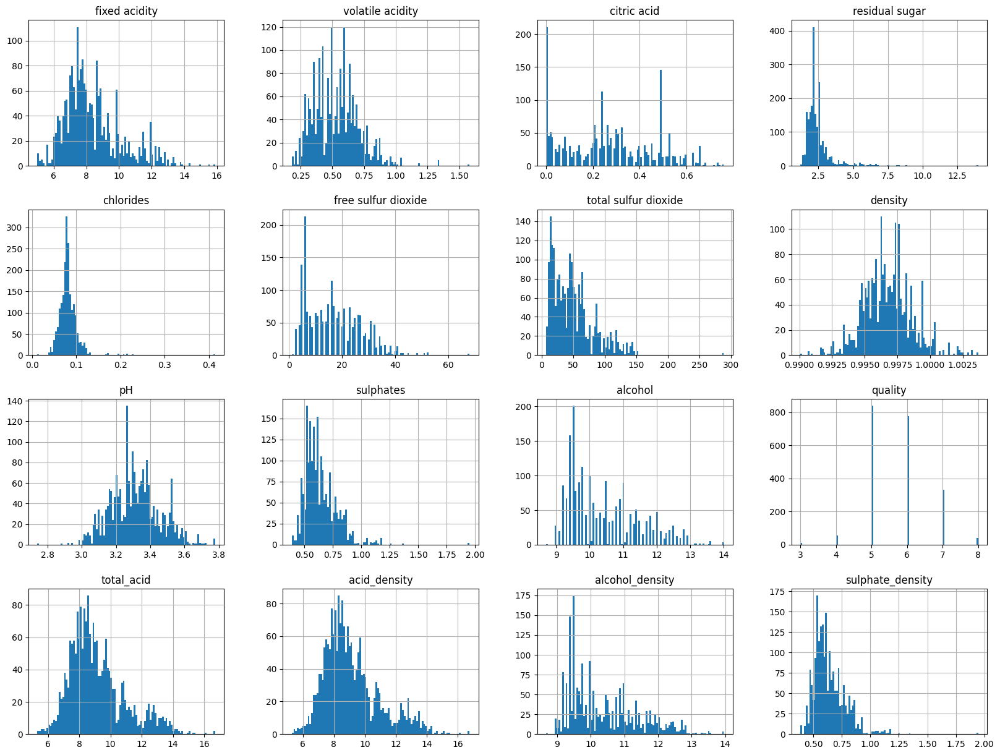

In [11]:
df_train.hist(bins=100, figsize=(20, 15))
plt.show

##### Some columns like chlorides, sulphates and more have many outliers skewing  the distributions

#### Removes outliers

In [12]:
df_t = df_train
print(len(df_t))
for c in [c for c in df_train.columns if c not in ['quality']]:
    first_percentile = df_train[c].quantile(0.001)
    ninety_ninth_percentile = df_train[c].quantile(0.99)
    df_t = df_t[(df_t[c] > first_percentile) & (df_t[c] < ninety_ninth_percentile)]
    
if True:
    c = 'chlorides'
    first_percentile = df_train[c].quantile(0.01)
    ninety_ninth_percentile = df_train[c].quantile(0.98)
    df_t = df_t[(df_t[c] > first_percentile) & (df_t[c] < ninety_ninth_percentile)]
print(len(df_t))

2056
1499


<function matplotlib.pyplot.show(close=None, block=None)>

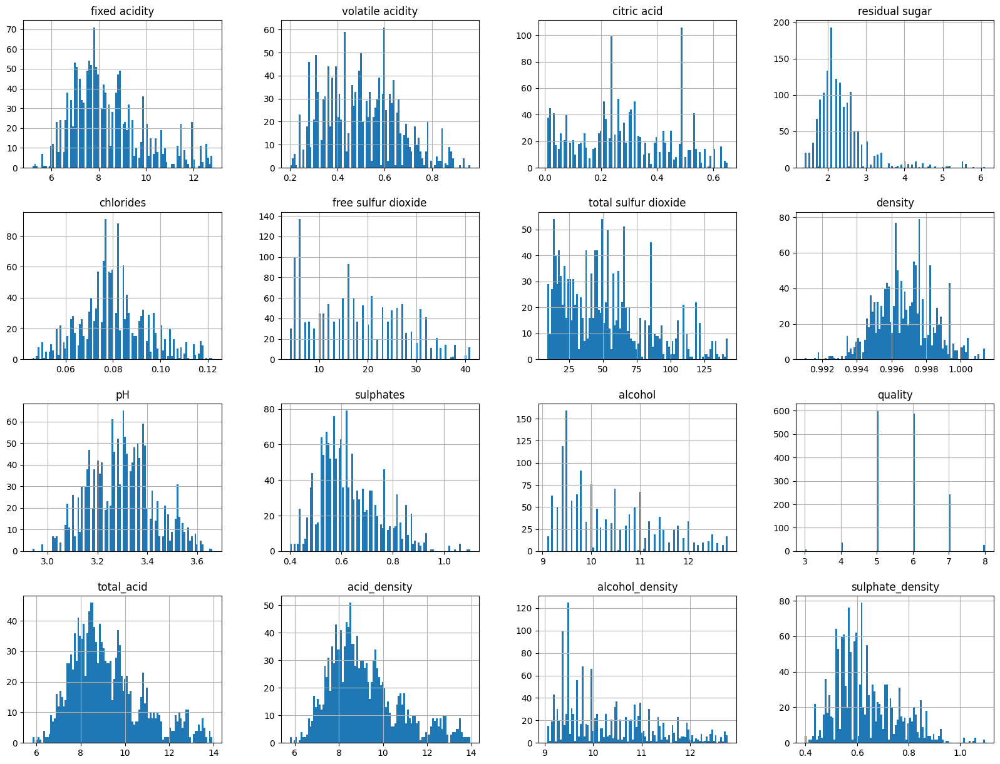

In [13]:
df_t.hist(bins=100, figsize=(20, 15))
plt.show

##### Most of the outliers have been removed, however we have lost 25% of the train data

In [14]:
tmp = df_train
df_train = df_t
len(df_train)

1499

In [15]:
scatter_matrix(df_train, figsize=(120, 80))
plt.savefig(r"figure_1.png")

#### The image can be downloaded to view in higher quality

In [16]:
df_train['quality'].value_counts()

5    600
6    587
7    242
4     37
8     25
3      8
Name: quality, dtype: int64

#### There is a very large class inbalace, this could result in our model never predicting class 3, 4 or 8. 94.844% of data belongs to class 5, 6 and 7.

#### Defines Target and Features

In [17]:
TARGET = 'quality'
NUM_FEATURES = [c for c in df_train.columns if c not in [TARGET]]

#### Encodes target labels

In [18]:
encoder = LabelEncoder()
y = encoder.fit_transform(df_train[TARGET])

#### Normalizes features

In [19]:
X = df_train.drop("quality", axis=1)
processing = ColumnTransformer([
    ('num', StandardScaler(), NUM_FEATURES)
])
X = processing.fit_transform(X)

# Oversampling to address class imbalance using SMOTE

In [20]:
from imblearn.over_sampling import ADASYN, SMOTE

# Create the SMOTE object
smote = SMOTE(sampling_strategy={3:600 , 4:600}, random_state=42)
print(f"Before: {len(X)}")
# Fit and transform the data to generate oversampled data
X_resampled, y_resampled = smote.fit_resample(X, y)
print(f"After: {len(X_resampled)}")
X = X_resampled
y = y_resampled

Before: 1499
After: 1870


# Trains models

In [21]:
models = []
prodictions = []
labels = []

for i in range (1):
    SKFs = StratifiedKFold(n_splits=5, shuffle=True, random_state=i)
    for fold, (idx_tr, idx_vl) in enumerate(SKFs.split(X, y)):
        
        clf = lgb.LGBMClassifier(
                        learning_rate=0.01,
                        depth = 3,
                        num_leaves = 10,
                        n_estimators=50,
                        reg_alpha = 1,
                        early_stopping_rounds = 1,
                        reg_lambda = 1,
                        subsample = 0.2,
                        rsm = 1.0,
                        min_data_in_leaf = 25,
                        l2_leaf_reg = 70,
                                )
        clf.fit(X[idx_tr], y[idx_tr],
                eval_set=(X[idx_vl], y[idx_vl])
               )
        
        prodiction = np.asarray(clf.predict(X[idx_vl]))
        label = y[idx_vl]
        labels = np.concatenate((labels, label), axis=None)
        prodictions = np.concatenate((prodictions, prodiction), axis=None)
        cks = cohen_kappa_score(prodiction, label, weights = "quadratic")
        print(f"cohen_kappa_score: {cks} accuracy_score:{accuracy_score(label, prodiction)}")
        
        models.append(clf)
        print('fold: ' + str(fold))

[LightGBM] [Warning] Unknown parameter: depth
[LightGBM] [Warning] Unknown parameter: rsm
[LightGBM] [Warning] Unknown parameter: l2_leaf_reg
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[LightGBM] [Warning] early_stopping_round is set=1, early_stopping_rounds=1 will be ignored. Current value: early_stopping_round=1
[1]	valid_0's multi_logloss: 1.24468
[2]	valid_0's multi_logloss: 1.23905
[3]	valid_0's multi_logloss: 1.23357
[4]	valid_0's multi_logloss: 1.22814
[5]	valid_0's multi_logloss: 1.22296
[6]	valid_0's multi_logloss: 1.21827
[7]	valid_0's multi_logloss: 1.21369
[8]	valid_0's multi_logloss: 1.20927
[9]	valid_0's multi_logloss: 1.20506
[10]	valid_0's multi_logloss: 1.20084
[11]	valid_0's multi_logloss: 1.19687
[12]	valid_0's multi_logloss: 1.19272
[13]	valid_0's multi_logloss: 1.18887
[14]	valid_0's multi_logloss: 1.18486
[15]	valid_0's multi_logloss: 1.18101
[16]	valid_0's multi_logloss: 1.17746
[17]	v

cohen_kappa_score: 0.5963734049697783 accuracy_score:0.5957219251336898


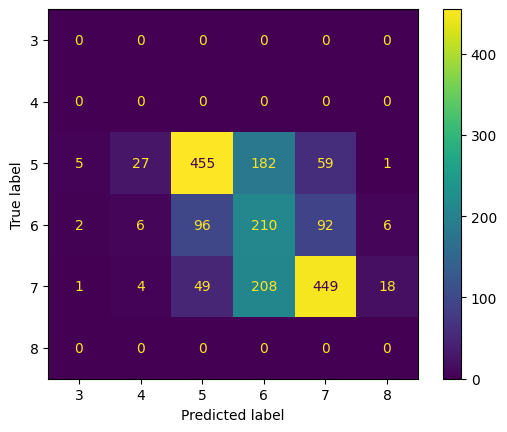

In [22]:
cks = cohen_kappa_score(prodictions, labels, weights = "quadratic")
print(f"cohen_kappa_score: {cks} accuracy_score:{accuracy_score(labels, prodictions)}")
cm = confusion_matrix(prodictions, labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=encoder.classes_)
disp.plot()
plt.show()

#### Defines how to make prodictions

In [23]:
def make_predictions(model, data):
    return np.asarray(model.predict(data))

# Makes prodictions on train set

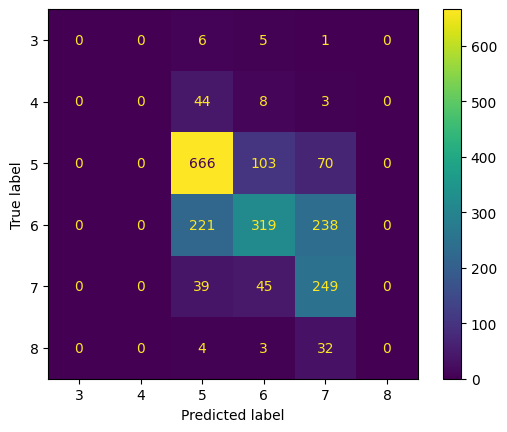

cohen_kappa_score: 0.564872852708543 accuracy_score: 0.5748663101604278


In [24]:
df_train = tmp
full_data = processing.transform(df_train.drop('quality', axis=1))
model_predictions = []

for model in models:
    model_predictions.append(make_predictions(model, full_data))

predictions = np.apply_along_axis(lambda x: np.bincount(x).argmax(), axis=0, arr=np.asarray(model_predictions))
predictions = encoder.inverse_transform(predictions)
cm = confusion_matrix(df_train['quality'], predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=encoder.classes_)
disp.plot()
plt.show()
cks = cohen_kappa_score(predictions, df_train['quality'], weights = "quadratic")
print(f"cohen_kappa_score: {cks} accuracy_score: {accuracy_score(label, prodiction)}")

# Makes submission

In [25]:
model_predictions = []
test_data =  processing.transform(df_test)

for model in models:
    model_predictions.append(make_predictions(model, np.array(test_data)))
    
finale_predictions = np.apply_along_axis(lambda x: np.bincount(x).argmax(), axis=0, arr=np.asarray(model_predictions))
finale_predictions = encoder.inverse_transform(finale_predictions)
submissions = pd.DataFrame({"Id": list(range(2056, 2056 + len(finale_predictions))), "quality": finale_predictions})
pd.DataFrame(submissions).to_csv("submission.csv", index=False, header=True)
submissions

,Id,quality
0,2056,5
1,2057,7
2,2058,6
3,2059,6
4,2060,7
...,...,...
1367,3423,5
1368,3424,7
1369,3425,5
1370,3426,5
